In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import sklearn.metrics
from matplotlib import pyplot as plt
import seaborn as sns

In [3]:
#adata=sc.read(results_file_post)
#adata.uns['log1p'] = {"base":None}

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 python-igraph==0.10.4 pynndescent==0.5.12


In [5]:
#%matplotlib inline

In [6]:
writeDir = "write/"

fileName = "Haensel_mouseSkinRegen"

resultsFileQC = writeDir + fileName + '_QC.h5ad' 


In [7]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, fontsize=10, format='png')
sc.settings.figdir = "figures/" + fileName + "/"
figName = fileName

# Read In Data

In [7]:
inDir = f'data/regenData/mouseSkinRegen'

In [8]:
adataUW1 = sc.read_10x_mtx(inDir, prefix="GSM4230076_Un-Wounded_1_scRNA-Seq_",cache=True)
adataUW1

... reading from cache file cache/data-regenData-mouseSkinRegen-GSM4230076_Un-Wounded_1_scRNA-Seq_matrix.h5ad
The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 5372 × 27998
    var: 'gene_ids', 'feature_types'

In [9]:
adataUW2 = sc.read_10x_mtx(inDir, prefix="GSM4230077_Un-Wounded_2_scRNA-Seq_",cache=True)
adataUW2

... reading from cache file cache/data-regenData-mouseSkinRegen-GSM4230077_Un-Wounded_2_scRNA-Seq_matrix.h5ad


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 5517 × 27998
    var: 'gene_ids', 'feature_types'

In [10]:
adataW1 = sc.read_10x_mtx(inDir, prefix="GSM4230078_Wounded_1_scRNA-Seq_",cache=True)
adataW1

... reading from cache file cache/data-regenData-mouseSkinRegen-GSM4230078_Wounded_1_scRNA-Seq_matrix.h5ad


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 7578 × 27998
    var: 'gene_ids', 'feature_types'

In [11]:
adataW2 = sc.read_10x_mtx(inDir, prefix="GSM4230079_Wounded_2_scRNA-Seq_",cache=True)
adataW2

... reading from cache file cache/data-regenData-mouseSkinRegen-GSM4230079_Wounded_2_scRNA-Seq_matrix.h5ad


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 4698 × 27998
    var: 'gene_ids', 'feature_types'

In [12]:
adataW3 = sc.read_10x_mtx(inDir, prefix="GSM4230080_Wounded_3_scRNA-Seq_",cache=True)
adataW3

... reading from cache file cache/data-regenData-mouseSkinRegen-GSM4230080_Wounded_3_scRNA-Seq_matrix.h5ad


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 4152 × 27998
    var: 'gene_ids', 'feature_types'

In [13]:
adata = an.concat([adataUW1, adataUW2,adataW1, adataW2,adataW3], 
                  label="label", keys=["UnWound_1","UnWound_2","Wound_1","Wound_2","Wound_3"],
                 index_unique="_")
adata

AnnData object with n_obs × n_vars = 27317 × 27998
    obs: 'label'

In [14]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [15]:
adata.obs 

,label
AAACCTGAGCCGTCGT-1_UnWound_1,UnWound_1
AAACCTGCAAGGGTCA-1_UnWound_1,UnWound_1
AAACCTGCACCCATGG-1_UnWound_1,UnWound_1
AAACCTGCAGATCCAT-1_UnWound_1,UnWound_1
AAACCTGCAGATCTGT-1_UnWound_1,UnWound_1
...,...
TTTGTCAGTCTCTTTA-1_Wound_3,Wound_3
TTTGTCAGTTACGGAG-1_Wound_3,Wound_3
TTTGTCAGTTTGACAC-1_Wound_3,Wound_3
TTTGTCATCATAAAGG-1_Wound_3,Wound_3


In [16]:
adata.var

""
Xkr4
Gm1992
Gm37381
Rp1
Rp1-1
...
AC168977.1
PISD
DHRSX
Vmn2r122


# QC

normalizing counts per cell
    finished (0:00:00)


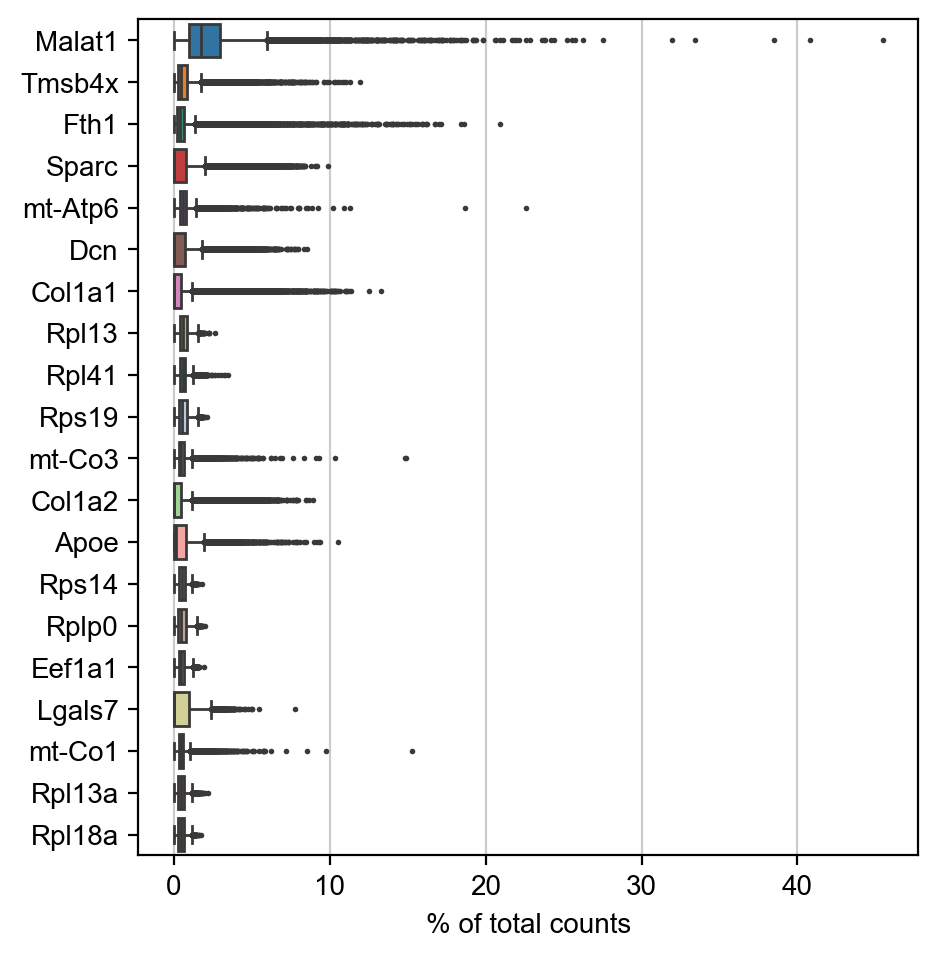

In [17]:
sc.pl.highest_expr_genes(adata, n_top=20, )

/tmp/ipykernel_3384869/3454098912.py:22: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


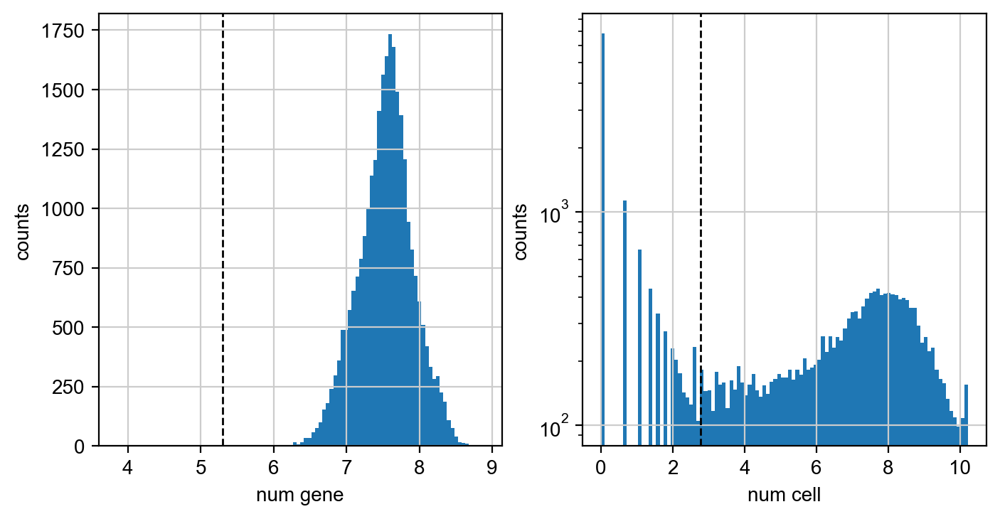

In [18]:
valX = adata.X>0
minGenes=200
minCells=15

fig, axs = plt.subplots(1, 2, figsize=(8, 4))

numCellwExp = valX.sum(axis=1)
axs[0].hist(np.log(numCellwExp), bins=100)#, log=True)
axs[0].axvline(np.log(minGenes), color='k', linestyle='dashed', linewidth=1)
axs[0].set_xlabel('num gene')
axs[0].set_ylabel('counts')

numGeneswExp = valX.sum(axis=0).T
axs[1].hist(np.log(numGeneswExp+1), bins=100, log=True)
axs[1].axvline(np.log(minCells+1), color='k', linestyle='dashed', linewidth=1)
#axs[0,1].axvline(np.log(600), color='k', linestyle='dashed', linewidth=1)
#axs[0,1].axvline(np.log(4000), color='k', linestyle='dashed', linewidth=1)
#axs[0,1].set_title('Gene means counts')
axs[1].set_xlabel('num cell')
axs[1].set_ylabel('counts')

fig.show()

In [19]:
sc.pp.filter_cells(adata, min_genes = minGenes)
sc.pp.filter_genes(adata, min_cells = minCells)

filtered out 64 cells that have less than 200 genes expressed
filtered out 11048 genes that are detected in less than 15 cells


In [20]:
adata = adata[:,np.logical_not(adata.var_names=="Malat1")]

## Mito QC

In [21]:
for g in adata.var_names:
    if "mt-" in g:
        print(g)

mt-Nd1
mt-Nd2
mt-Co1
mt-Co2
mt-Atp8
mt-Atp6
mt-Co3
mt-Nd3
mt-Nd4l
mt-Nd4
mt-Nd5
mt-Nd6
mt-Cytb


In [22]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') 
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], log1p = False, inplace=True)

/tmp/ipykernel_3384869/3426326396.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('mt-')


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


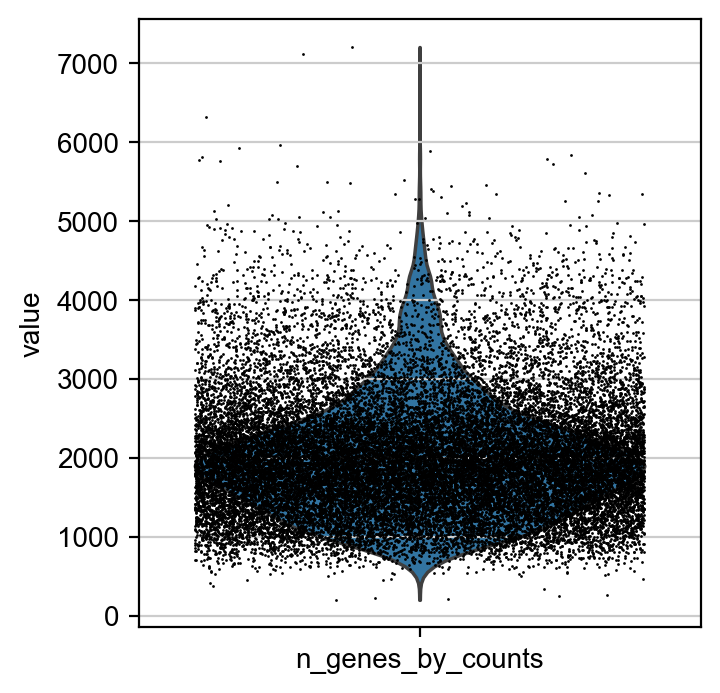

In [23]:
sc.pl.violin(adata, ['n_genes_by_counts'], jitter=0.4)

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


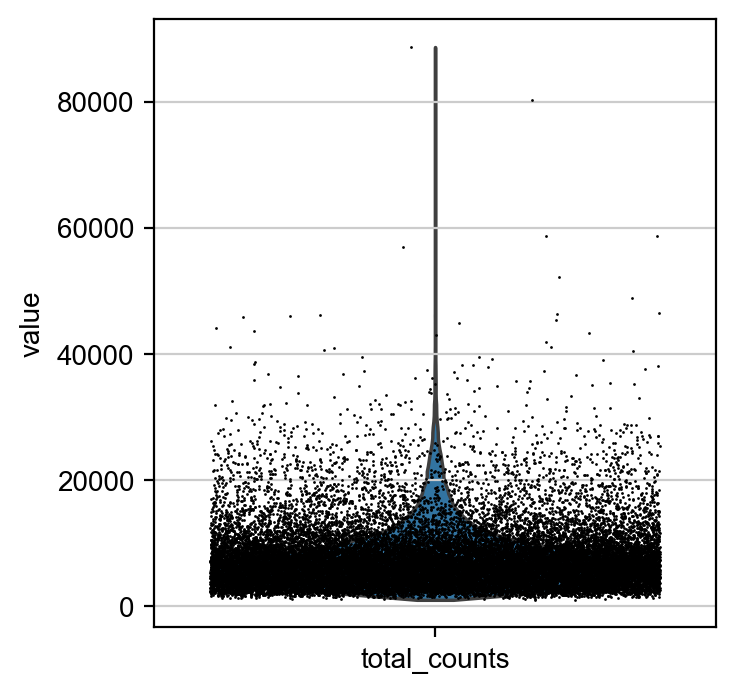

In [24]:
sc.pl.violin(adata, ['total_counts'], jitter=0.4)

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


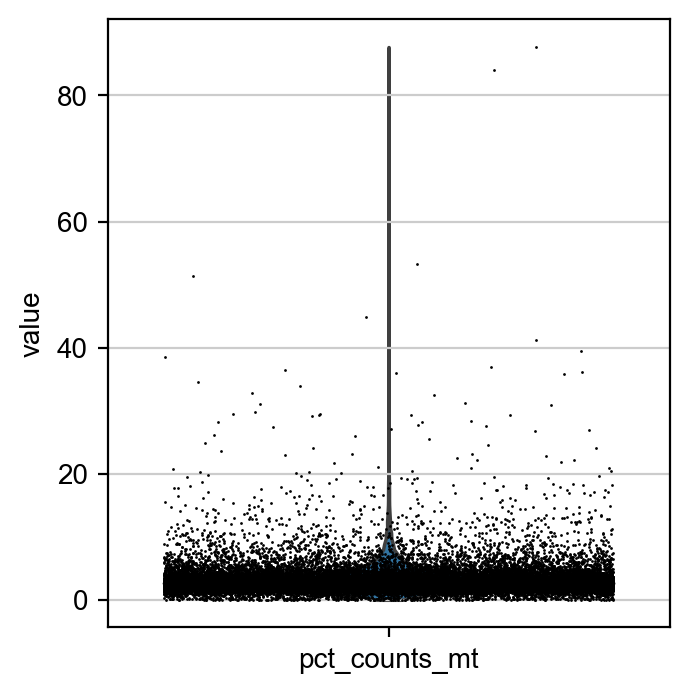

In [25]:
sc.pl.violin(adata, ['pct_counts_mt'], jitter=0.4)

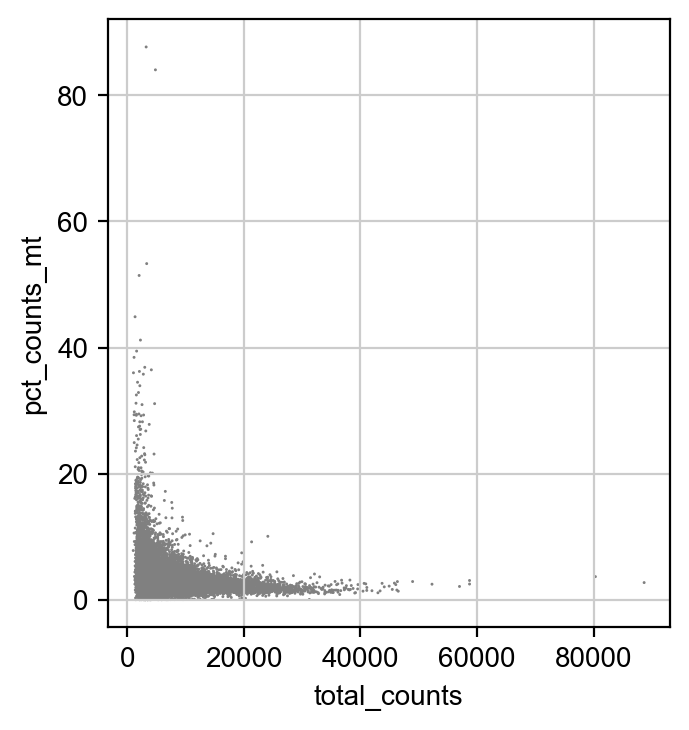

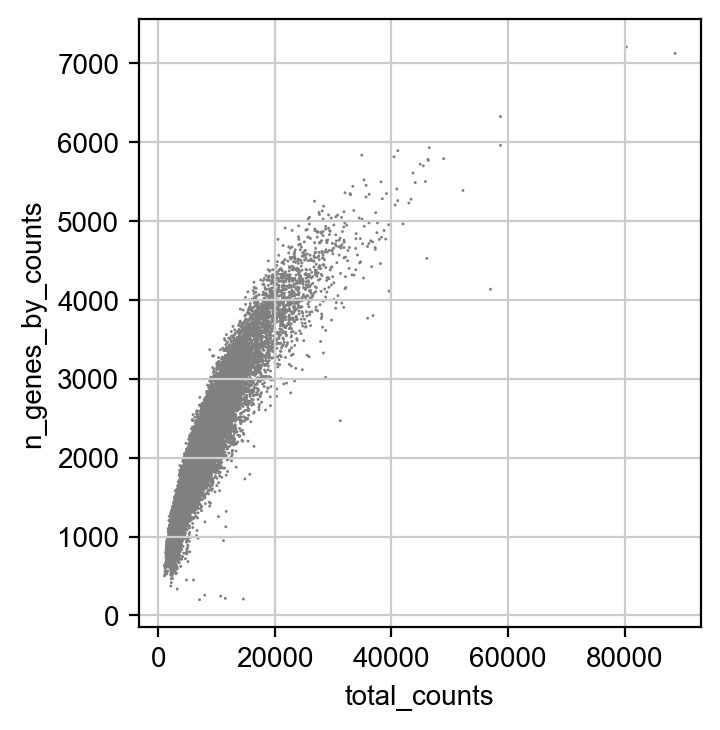

In [26]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

remove cells that have too much mito or could be doublets

In [27]:
adata = adata[adata.obs.n_genes_by_counts < 4500, :]
adata = adata[adata.obs.total_counts < 30000, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

save post QC scanpy

In [28]:
adata

View of AnnData object with n_obs × n_vars = 26566 × 16949
    obs: 'label', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [29]:
resultsFileQC

'write/Haensel_mouseSkinRegen_QC.h5ad'

In [30]:
adata.write(resultsFileQC)

# Analysis

In [8]:
resultsFile = writeDir + fileName + '.h5ad'       # final output
resultsFileQC = writeDir + fileName + '_QC.h5ad'  # post QC (pre-analysis) 

Set figure parameters

In [9]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, fontsize=10, format='png')
sc.settings.figdir = "figures/" + fileName + "/"
figName = fileName

In [10]:
adata = sc.read_h5ad(resultsFileQC)
adata

AnnData object with n_obs × n_vars = 26566 × 16949
    obs: 'label', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [11]:
sc.pp.normalize_total(adata,target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [12]:
sc.pp.log1p(adata)

In [13]:
sc.pp.highly_variable_genes(adata)#, flavor = "seurat", n_top_genes=2000)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


1821


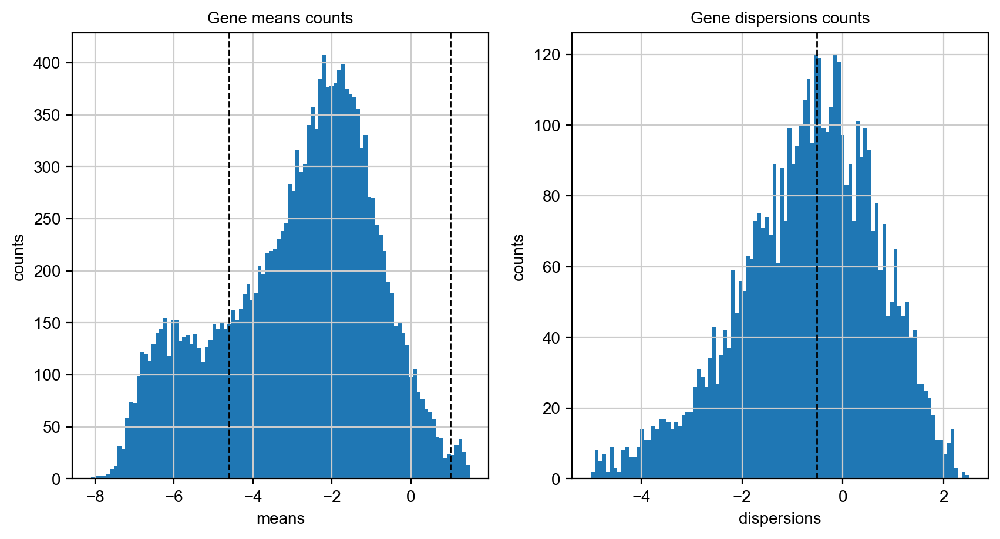

In [14]:
minMean = 0.01
maxMean = 2.7
minDisp = 0.6

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

means = adata.var[["means"]][adata.var[["means"]] > np.exp(-14)]#adata.var[["means"]],
axs[0].hist(np.log(means), bins=100)#, log=True),
axs[0].axvline(np.log(minMean), color='k', linestyle='dashed', linewidth=1)
axs[0].axvline(np.log(maxMean), color='k', linestyle='dashed', linewidth=1)
axs[0].set_title('Gene means counts')
axs[0].set_xlabel('means')
axs[0].set_ylabel('counts')

dispNorm = adata.var[["dispersions_norm"]][adata.var[["dispersions_norm"]] > np.exp(-5)]#adata.var[["means"]],
axs[1].hist(np.log(dispNorm), bins=100)#, log=True),
axs[1].axvline(np.log(minDisp), color='k', linestyle='dashed', linewidth=1)
axs[1].set_title('Gene dispersions counts')
axs[1].set_xlabel('dispersions')
axs[1].set_ylabel('counts')

sc.pp.highly_variable_genes(adata, min_disp=minDisp, min_mean=minMean, max_mean=maxMean)
print(sum(adata.var.highly_variable))

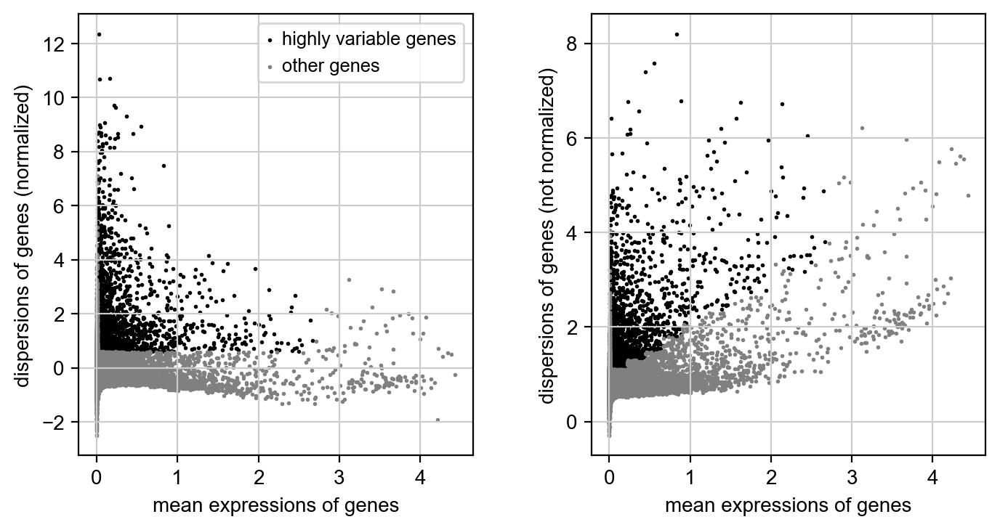

In [15]:
sc.pl.highly_variable_genes(adata)

In [16]:
#for inGene in adata.var[-8:].index.tolist():
#    adata.var.loc[inGene,"highly_variable"] = False

In [17]:
adata.raw = adata

In [18]:
#adata = adata[:, adata.var.highly_variable]
adata = adata[:, np.logical_and(adata.var.highly_variable, np.logical_not(adata.var.mt))]

In [19]:
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [20]:
#sc.pp.scale(adata, max_value=10)

In [21]:
sc.tl.pca(adata, n_comps = 100, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=100


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca


    finished (0:00:02)


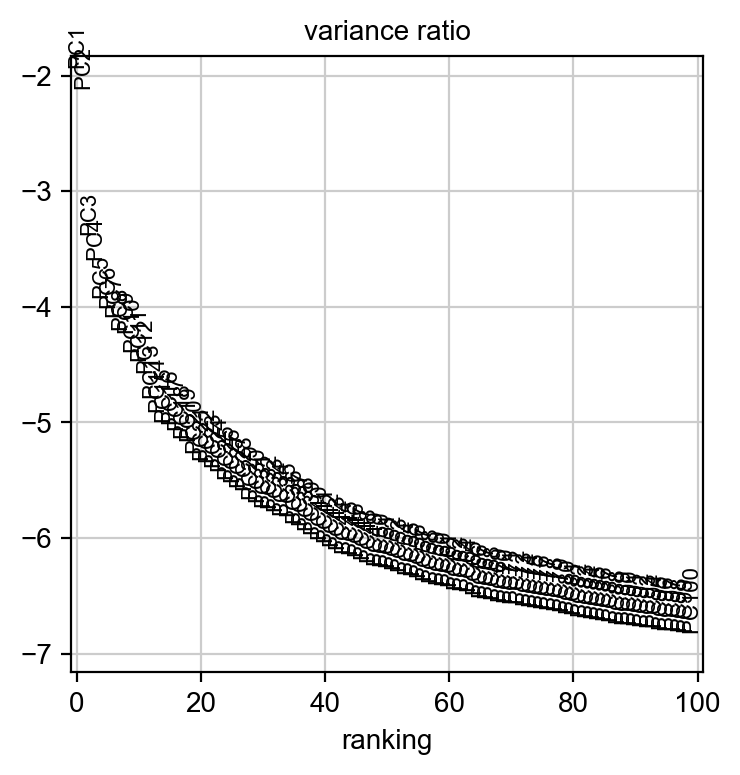

In [22]:
sc.pl.pca_variance_ratio(adata, n_pcs = 100, log=True)

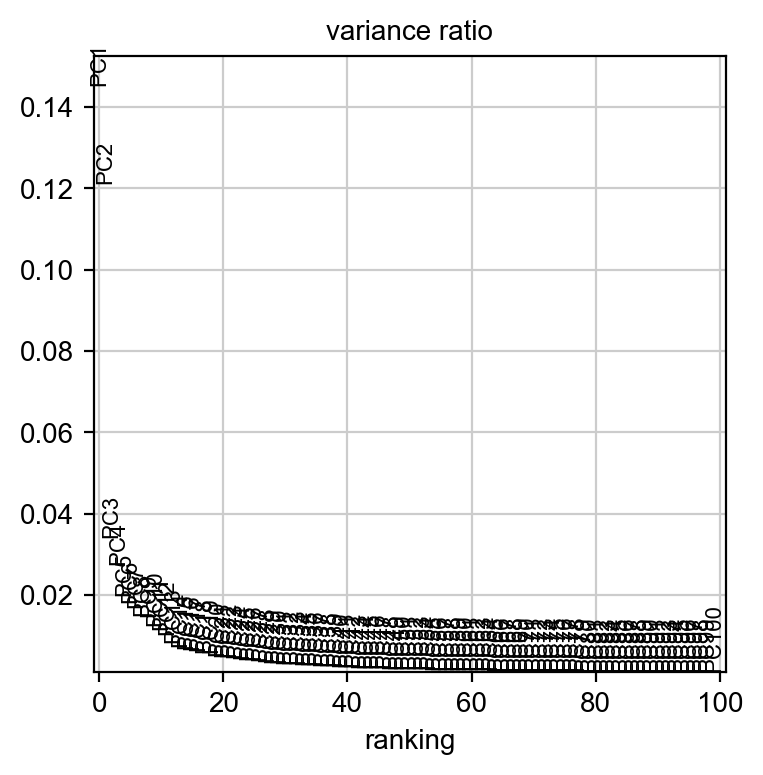

In [23]:
sc.pl.pca_variance_ratio(adata, n_pcs = 100)

In [24]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)


In [25]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


In [26]:
sc.tl.leiden(adata, resolution=0.005)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [27]:
adata.obs["wound"] = pd.Categorical([lab.split("_")[0] for lab in adata.obs.label])

In [28]:
adata.obs

,label,n_genes,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,pct_counts_mt,leiden,wound
AAACCTGAGCCGTCGT-1_UnWound_1,UnWound_1,2304,2303,9337.0,35.536039,48.356003,60.790404,74.724215,150.0,1.606512,1,UnWound
AAACCTGCAAGGGTCA-1_UnWound_1,UnWound_1,3693,3691,17805.0,26.644201,38.809323,51.968548,67.155293,320.0,1.797248,1,UnWound
AAACCTGCACCCATGG-1_UnWound_1,UnWound_1,1730,1729,4885.0,32.978506,46.632549,59.037871,73.858751,170.0,3.480041,1,UnWound
AAACCTGCAGATCCAT-1_UnWound_1,UnWound_1,2093,2092,7182.0,32.442217,45.920356,58.911167,73.781676,198.0,2.756892,1,UnWound
AAACCTGCAGATCTGT-1_UnWound_1,UnWound_1,1543,1542,4346.0,32.719742,46.203405,59.917165,76.023930,198.0,4.555913,1,UnWound
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTCTCTTTA-1_Wound_3,Wound_3,2233,2231,8349.0,32.950054,49.562822,61.935561,74.907175,126.0,1.509163,1,Wound
TTTGTCAGTTACGGAG-1_Wound_3,Wound_3,3162,3160,15856.0,28.285822,43.895055,57.391524,71.979062,322.0,2.030777,0,Wound
TTTGTCAGTTTGACAC-1_Wound_3,Wound_3,1628,1626,5109.0,33.744373,47.171658,60.559796,76.277158,248.0,4.854179,0,Wound
TTTGTCATCATAAAGG-1_Wound_3,Wound_3,1487,1486,5614.0,39.348058,53.633773,67.100107,81.439259,48.0,0.855005,0,Wound


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

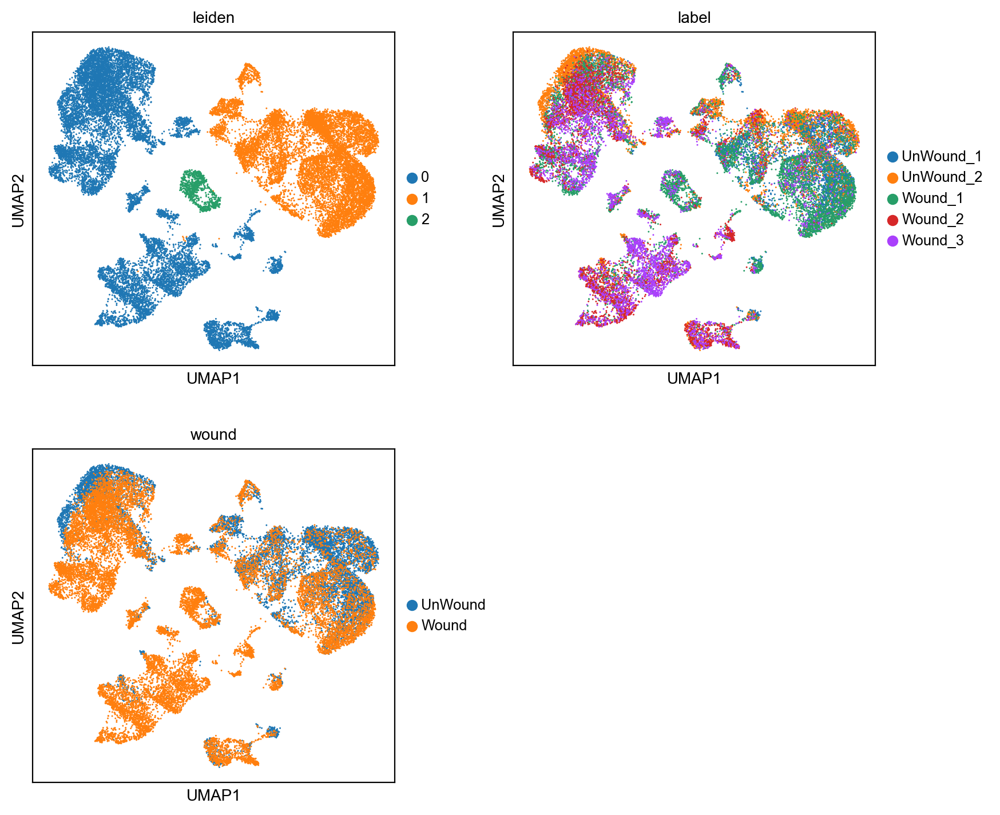

In [29]:
sc.pl.umap(adata, color=["leiden","label","wound"],ncols=2)

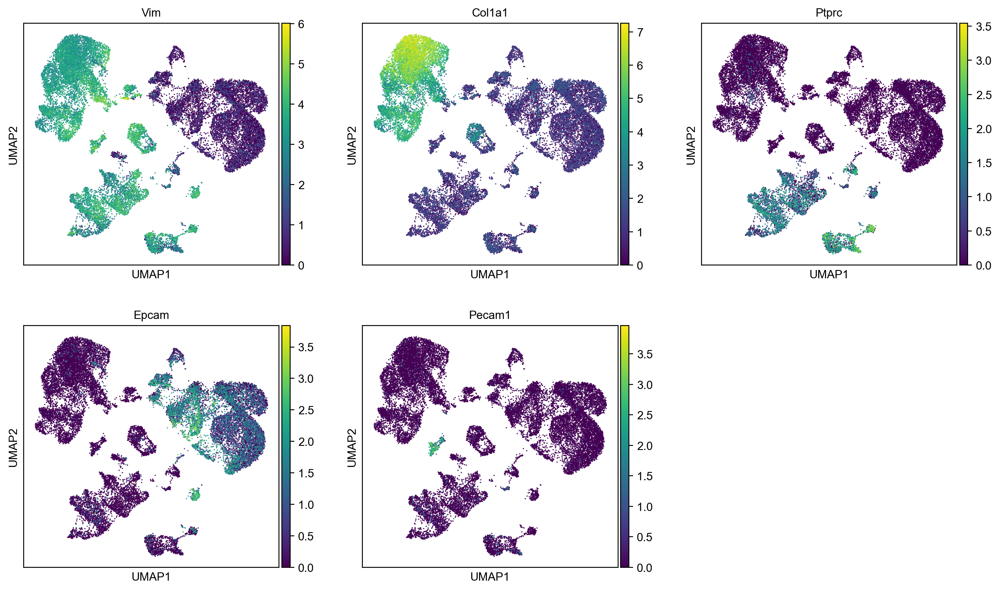

In [30]:
sc.pl.umap(adata, color=["Vim","Col1a1","Ptprc","Epcam","Pecam1"],ncols=3)

In [31]:
#sc.pl.umap(adata, color=["n_genes","pct_counts_mt","total_counts"])

ranking genes


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


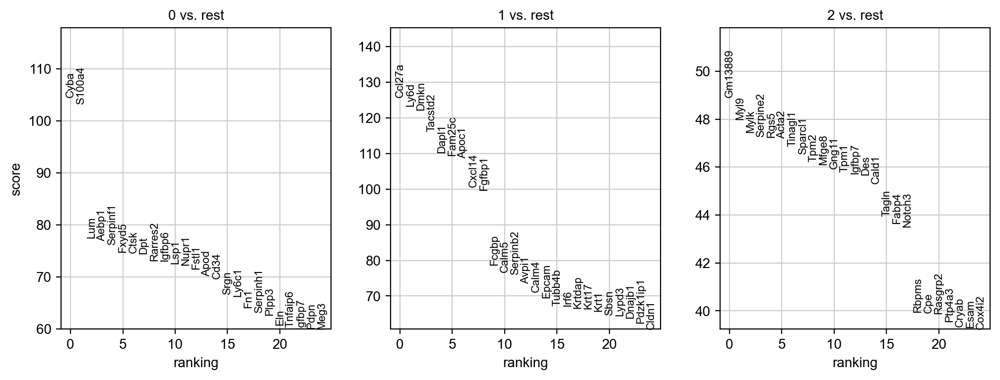

In [32]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', use_raw=False)
#sc.tl.filter_rank_genes_groups(adata, groupby="leiden", use_raw=False,
#                                   key_added='rank_genes_groups_filtered', 
#                                   min_in_group_fraction=0.25, min_fold_change=1, max_out_group_fraction=0.5, compare_abs=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [33]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(15)

,0,1,2
0,Cyba,Ccl27a,Gm13889
1,S100a4,Ly6d,Myl9
2,Lum,Dmkn,Mylk
3,Aebp1,Tacstd2,Serpine2
4,Serpinf1,Dapl1,Rgs5
5,Fxyd5,Fam25c,Acta2
6,Ctsk,Apoc1,Tinagl1
7,Dpt,Cxcl14,Sparcl1
8,Rarres2,Fgfbp1,Tpm2
9,Igfbp6,Fcgbp,Mfge8


    using 'X_pca' with n_pcs = 40
Storing dendrogram info using `.uns['dendrogram_leiden']`


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/tools/_dendrogram.py:133: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/get/get.py:66: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/get/get.py:66: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What

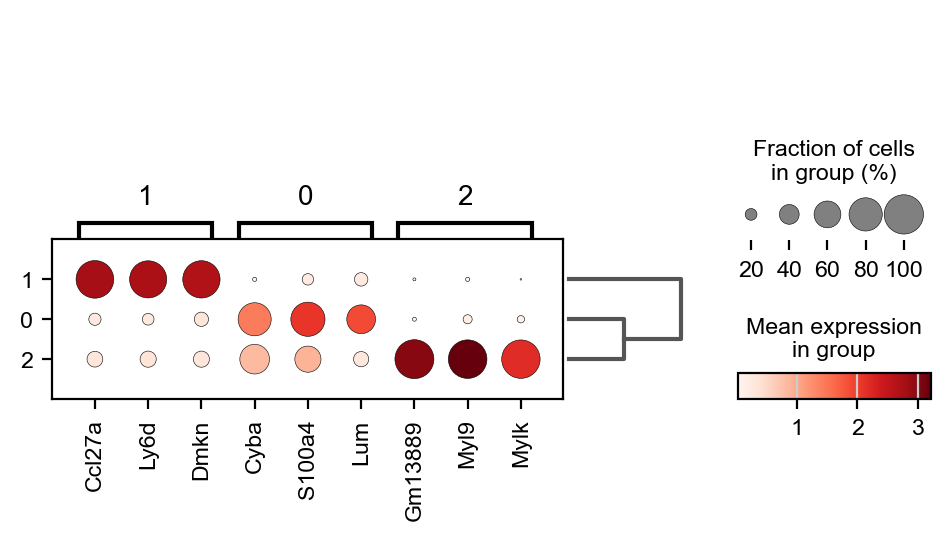

In [34]:
sc.tl.dendrogram(adata,groupby="leiden", n_pcs=40)
sc.pl.rank_genes_groups_dotplot(adata,n_genes=3)#,key="rank_genes_groups_filtered")

In [35]:
resultsFile

'write/Haensel_mouseSkinRegen.h5ad'

# Post

In [36]:
adata.write(resultsFile)

adata = sc.read_h5ad('write/Haensel_mouseSkinRegen.h5ad')



In [37]:
resultsFile = 'write/Haensel_mouseSkinRegen_regen.h5ad'

In [38]:
adata = adata[[led !="1" for led in adata.obs.leiden]].raw.to_adata()

In [39]:
adata.uns['log1p']['base']=None

In [40]:
sc.pp.highly_variable_genes(adata)#, flavor = "seurat", n_top_genes=2000)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


extracting highly variable genes


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
1884


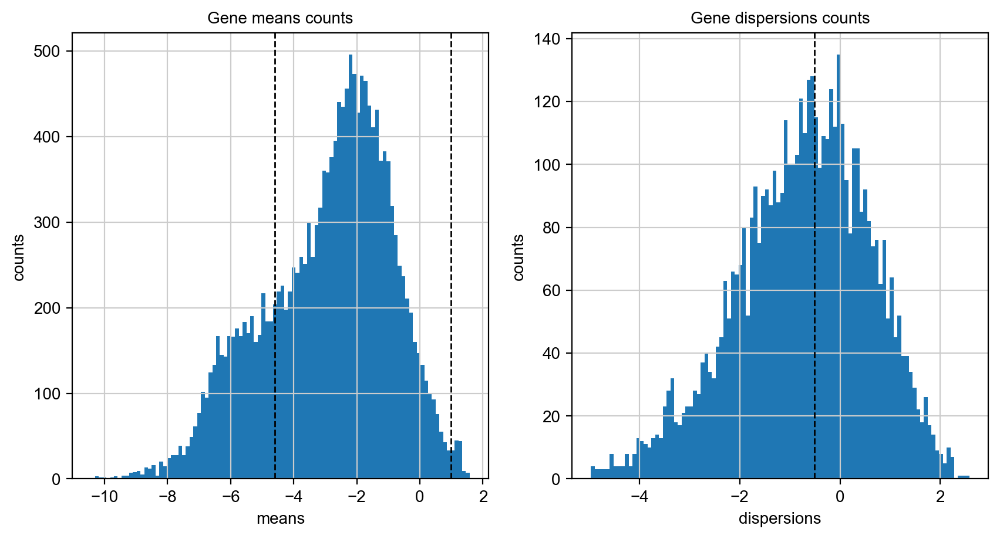

In [41]:
minMean = 0.01
maxMean = 2.7
minDisp = 0.6

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

means = adata.var[["means"]][adata.var[["means"]] > np.exp(-14)]#adata.var[["means"]],
axs[0].hist(np.log(means), bins=100)#, log=True),
axs[0].axvline(np.log(minMean), color='k', linestyle='dashed', linewidth=1)
axs[0].axvline(np.log(maxMean), color='k', linestyle='dashed', linewidth=1)
axs[0].set_title('Gene means counts')
axs[0].set_xlabel('means')
axs[0].set_ylabel('counts')

dispNorm = adata.var[["dispersions_norm"]][adata.var[["dispersions_norm"]] > np.exp(-5)]#adata.var[["means"]],
axs[1].hist(np.log(dispNorm), bins=100)#, log=True),
axs[1].axvline(np.log(minDisp), color='k', linestyle='dashed', linewidth=1)
axs[1].set_title('Gene dispersions counts')
axs[1].set_xlabel('dispersions')
axs[1].set_ylabel('counts')

sc.pp.highly_variable_genes(adata, min_disp=minDisp, min_mean=minMean, max_mean=maxMean)
print(sum(adata.var.highly_variable))

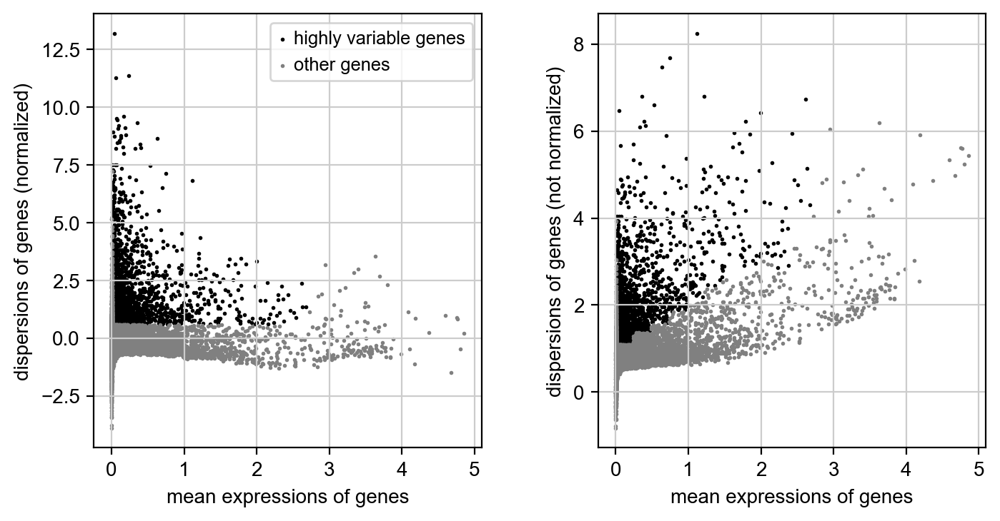

In [42]:
sc.pl.highly_variable_genes(adata)

In [43]:
#for inGene in adata.var[-8:].index.tolist():
#    adata.var.loc[inGene,"highly_variable"] = False

In [44]:
adata.raw = adata

In [45]:
#adata = adata[:, adata.var.highly_variable]
adata = adata[:, np.logical_and(adata.var.highly_variable, np.logical_not(adata.var.mt))]

In [46]:
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [47]:
#sc.pp.scale(adata, max_value=10)

In [48]:
sc.tl.pca(adata, n_comps = 100, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:01)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca


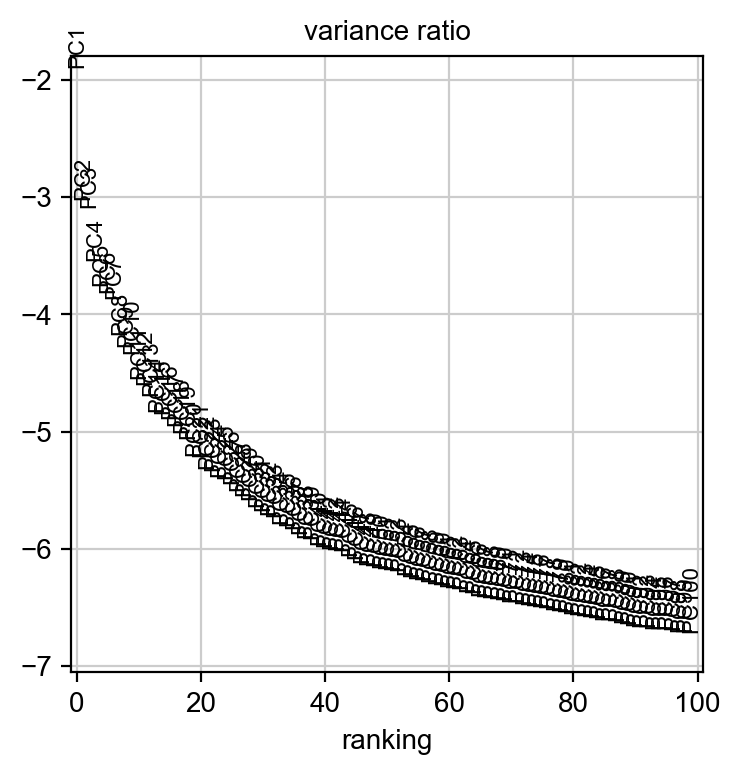

In [49]:
sc.pl.pca_variance_ratio(adata, n_pcs = 100, log=True)

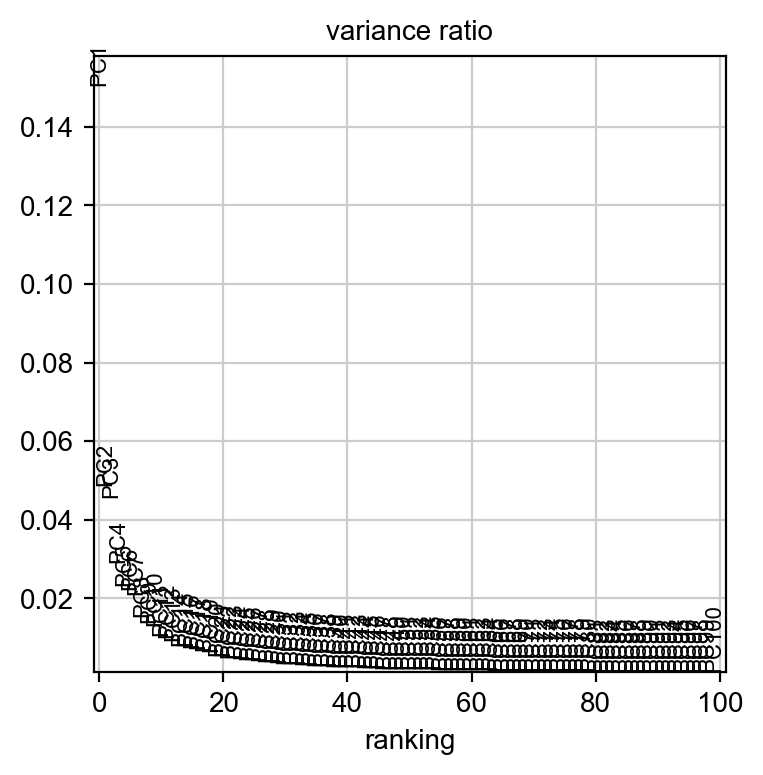

In [50]:
sc.pl.pca_variance_ratio(adata, n_pcs = 100)

In [51]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [52]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


In [53]:
sc.tl.leiden(adata, resolution=0.1)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [54]:
adata.obs

,label,n_genes,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,pct_counts_mt,leiden,wound
AAACCTGGTCCAGTAT-1_UnWound_1,UnWound_1,1286,1284,3682.0,40.738729,51.683867,63.579576,78.707224,205.0,5.567626,1,UnWound
AAACGGGAGAATCTCC-1_UnWound_1,UnWound_1,2170,2169,6299.0,31.512939,41.054136,52.690903,68.852199,117.0,1.857438,0,UnWound
AAAGATGCATCTACGA-1_UnWound_1,UnWound_1,1306,1305,3213.0,34.858388,45.440398,57.640834,74.945534,145.0,4.512916,0,UnWound
AAAGATGCATGGGACA-1_UnWound_1,UnWound_1,934,933,1432.0,23.393855,34.078212,48.044693,69.762570,52.0,3.631285,0,UnWound
AAAGCAAGTACACCGC-1_UnWound_1,UnWound_1,2181,2180,5977.0,27.421784,40.572193,53.220679,68.161285,194.0,3.245775,3,UnWound
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGCTAGGCA-1_Wound_3,Wound_3,932,931,3682.0,53.530690,63.307985,74.443237,88.294405,2.0,0.054318,7,Wound
TTTGTCAAGTAGGTGC-1_Wound_3,Wound_3,1226,1224,5442.0,46.416759,58.342521,71.481073,86.585814,1.0,0.018376,7,Wound
TTTGTCAGTTACGGAG-1_Wound_3,Wound_3,3162,3160,15856.0,28.285822,43.895055,57.391524,71.979062,322.0,2.030777,1,Wound
TTTGTCAGTTTGACAC-1_Wound_3,Wound_3,1628,1626,5109.0,33.744373,47.171658,60.559796,76.277158,248.0,4.854179,0,Wound


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

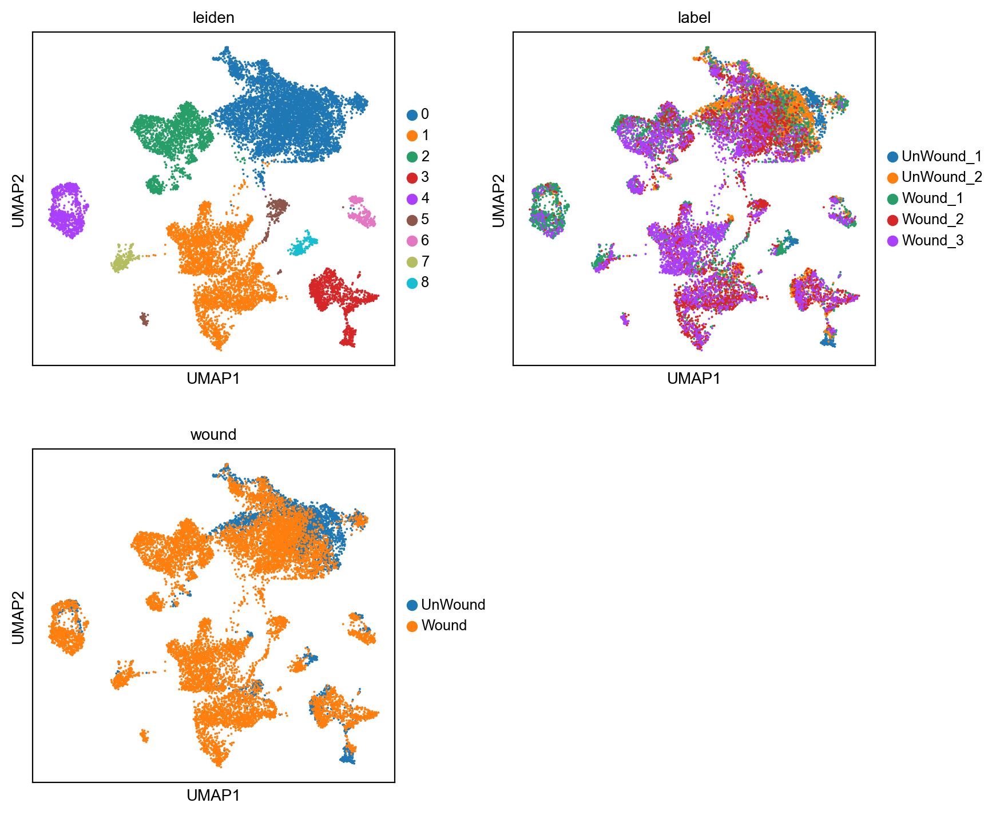

In [55]:
sc.pl.umap(adata, color=["leiden","label","wound"],ncols=2)

In [59]:
homology = pd.read_table("../mhCompTiss/data/hgncHM_121.csv", sep=",")
mouseGenes = np.array(homology["mouse"])
humanGenes = np.array(homology["human"])
m2h = dict(zip(mouseGenes,humanGenes))
h2m = dict(zip(humanGenes,mouseGenes))
#[m2h[g] for g in adiGenes if g in m2h.keys()]
def convertDf(inDf, convDict):
    newGs = []
    for gs in inDf:
        newGs.append([convDict[g] for g in inDf[gs] if g in convDict.keys()])
    return(pd.DataFrame(newGs, index=inDf.columns).T)

In [60]:
sigFile = "data/geneSigs/multiGeneSig.xlsx"
hMultiGS = pd.read_excel(sigFile,sheet_name=2,skiprows=2)
mMultiGS = convertDf(hMultiGS, h2m)
mStressGS = mMultiGS[["Stress"]]
stress = mStressGS.dropna().values.flatten()

In [61]:
stress

array(['Abhd3', 'Adamts1', 'Ankrd28', 'Ankrd37', 'Arc', 'Areg', 'Arid5b',
       'Arl5b', 'Atf3', 'B3gnt5', 'Bag3', 'Bambi', 'Bbc3', 'Bhlhe40',
       'Birc3', 'Brd2', 'Btg1', 'Btg2', 'Gm13889', 'Car12', 'Ccl20',
       'Ccnl1', 'Ccp110', 'Cdkn1a', 'Cdkn2aip', 'Cebpb', 'Cebpd',
       'Cited2', 'Cldn3', 'Cldn4', 'Clk1', 'Csrnp1', 'Cyp1b1', 'Dapp1',
       'Depp1', 'Dnaja1', 'Dnaja4', 'Dnajb1', 'Dnajb4', 'Dsc3', 'Dusp1',
       'Dusp10', 'Dusp14', 'Dusp2', 'Dusp5', 'Edn1', 'Efna1', 'Egr1',
       'Egr2', 'Egr3', 'Ehf', 'Eif4a2', 'Elf3', 'Emp1', 'Epha2', 'Ereg',
       'Errfi1', 'Ets2', 'Fads3', 'Fam133b', 'Fam53c', 'Fgfr3', 'Fhl2',
       'Fkbp4', 'Fos', 'Fosb', 'Fosl1', 'Fosl2', 'Frmd4b', 'Fus',
       'Gadd45a', 'Gadd45b', 'Gadd45g', 'Gdf15', 'Gem', 'Golgb1', 'Hbegf',
       'Hes1', 'Hexim1', 'Hsp90aa1', 'Hspa1a', 'Hspa1b', 'Hspa5', 'Hspa8',
       'Hspb1', 'Hsph1', 'Id1', 'Id2', 'Ier2', 'Ier3', 'Ier5', 'Ifrd1',
       'Irx2', 'Itpkc', 'Jag1', 'Jun', 'Junb', 'Jund', 'Kcnq1ot1',
      

In [79]:
#sigFile = "data/geneSigs/rengenGeneLists/RengenIntestMorralCl14.csv"
#sigGenes = pd.read_csv(sigFile, skiprows=1)#

#revSC = sigGenes["genes"].values
#revSC
#sc.tl.score_genes(adata, revSC, score_name="revSC_score")

In [62]:
sc.tl.score_genes(adata, stress, score_name="stress_score")

computing score 'stress_score'
    finished: added
    'stress_score', score of gene set (adata.obs).
    1086 total control genes are used. (0:00:00)


In [63]:
sigFile = "data/geneSigs/rengenGeneLists/woundSkin.csv"
sigGenes = pd.read_csv(sigFile)
woundSkin = sigGenes["gene"]
sc.tl.score_genes(adata, woundSkin, score_name="wounded_score")

computing score 'wounded_score'
    finished: added
    'wounded_score', score of gene set (adata.obs).
    799 total control genes are used. (0:00:00)


In [64]:
sigFile = "../mhCompTiss/data/LUAD/simpLUADbig.csv"
sigGenes = pd.read_csv(sigFile)
hpcs = sigGenes["HPCS"].dropna()
hpcs = hpcs[1:]
hpcs

1        Il23a
2         Rrad
3          Tnf
4        Abtb2
5          Lif
        ...   
295    Akirin1
296       Smg7
297     Mindy3
298       Eea1
299      Neat1
Name: HPCS, Length: 299, dtype: object

In [65]:
sc.tl.score_genes(adata, hpcs, score_name="HPCS_score")

computing score 'HPCS_score'
    finished: added
    'HPCS_score', score of gene set (adata.obs).
    1182 total control genes are used. (0:00:00)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


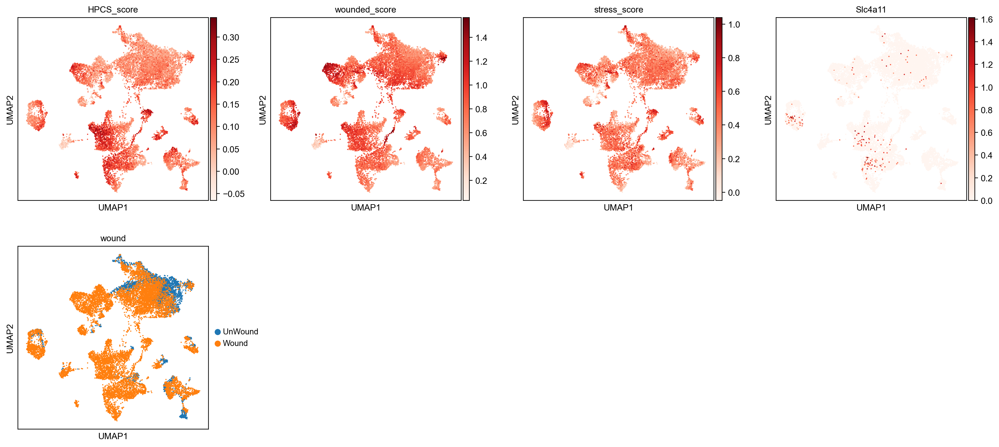

In [67]:
sc.pl.umap(adata, color=["HPCS_score","wounded_score","stress_score","Slc4a11","wound"],ncols=4, cmap="Reds")

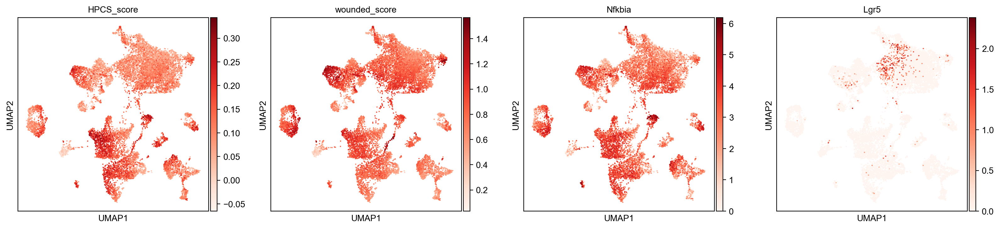

In [84]:
sc.pl.umap(adata, color=["HPCS_score","wounded_score","Nfkbia","Lgr5"],ncols=4, cmap="Reds")

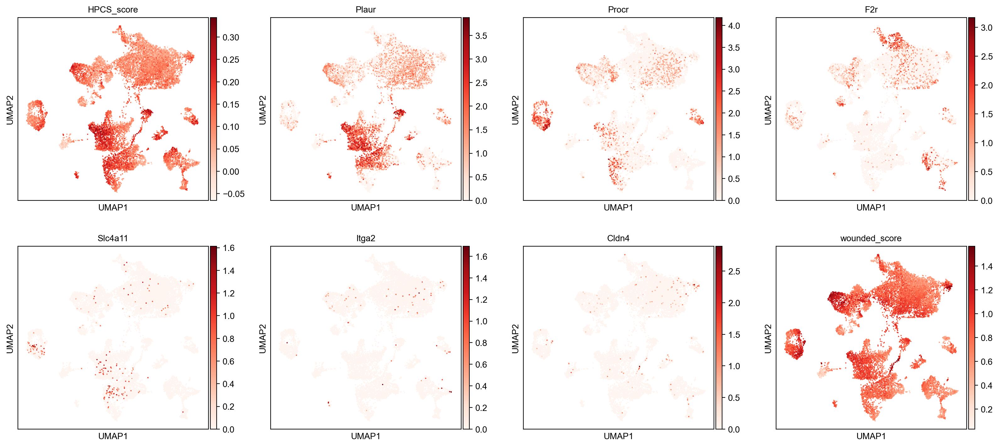

In [85]:
sc.pl.umap(adata, color=["HPCS_score","Plaur", "Procr", "F2r", 
                         "Slc4a11", "Itga2", "Cldn4","wounded_score"],ncols=4, cmap="Reds")

In [70]:
from scipy import stats

def plotScatter(obsDF, xLabel, yLabel, name, save=False):
    xVal, yVal = obsDF[xLabel].values, obsDF[yLabel].values
    m, b, r_value, p_value, std_err = stats.linregress(xVal, yVal)
    
    fig, ax = plt.subplots()
    ax.grid(False)
    ax.scatter(xVal,yVal)
    ax.plot(xVal, m*xVal + b, c="red")
    ax.annotate(f"r^2: {r_value**2:.2f}", xy=(-0.05,np.max(yVal)*0.95))
    ax.annotate(f"pVal: {p_value:.2f}", xy=(-0.05,np.max(yVal)*0.85))

    ax.set_xlabel(xLabel)
    ax.set_ylabel(yLabel)
    ax.set_title(name)
    plt.show()
    if(save):
        fig.savefig(f"{save}/{name}_{xLabel}{yLabel}_scatter.svg")

def plotBoxPlot(dataDF, label, geneExp, gene, name, save=False):
    slcPos = dataDF[label].values[geneExp]
    slcNeg = dataDF[label].values[np.logical_not(geneExp)]

    # Create a figure and axis
    fig, ax = plt.subplots()
    ax.grid(False)
    # Create box plots
    box1 = ax.violinplot(slcPos, positions=[1], showmeans=True, widths=0.6)
    box2 = ax.violinplot(slcNeg, positions=[2], showmeans=True, widths=0.6)
    
    # Perform a t-test to get the p-value
    t_stat, p_val = stats.ttest_ind(slcPos, slcNeg)
    
    # Add p-value bracket and stars to the plot
    x1, x2 = 1, 2
    y, h, col = max(np.max(slcPos), np.max(slcNeg)), 0.1, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    ax.text((x1+x2)*.5, y+h-0.1, f'{p_val:.3e}', ha='center', va='bottom', color=col)
    
    # Add stars based on p-value significance
    if p_val < 0.001:
        stars = '***'
    elif p_val < 0.01:
        stars = '**'
    elif p_val < 0.05:
        stars = '*'
    else:
        stars = 'ns'  # not significant
    
    ax.text((x1+x2)*.5, y+h, stars, ha='center', va='bottom', color=col)
    
    # Add p-value text to the plot
    #plt.text(1.5, max(np.max(slcPos), np.max(slcNeg)), f'p-value: {p_val:.3e}', ha='center')
    
    # Set x-axis labels
    ax.set_xticks([1, 2])
    ax.set_xticklabels([f'{gene}+', f'{gene}-'])
    
    # Set title and labels
    ax.set_title(name)
    ax.set_ylabel(f'{label} Score')
    
    # Show the plot
    plt.show()
    if(save):
        fig.savefig(f"{save}/{name}{label}_{gene}.svg")

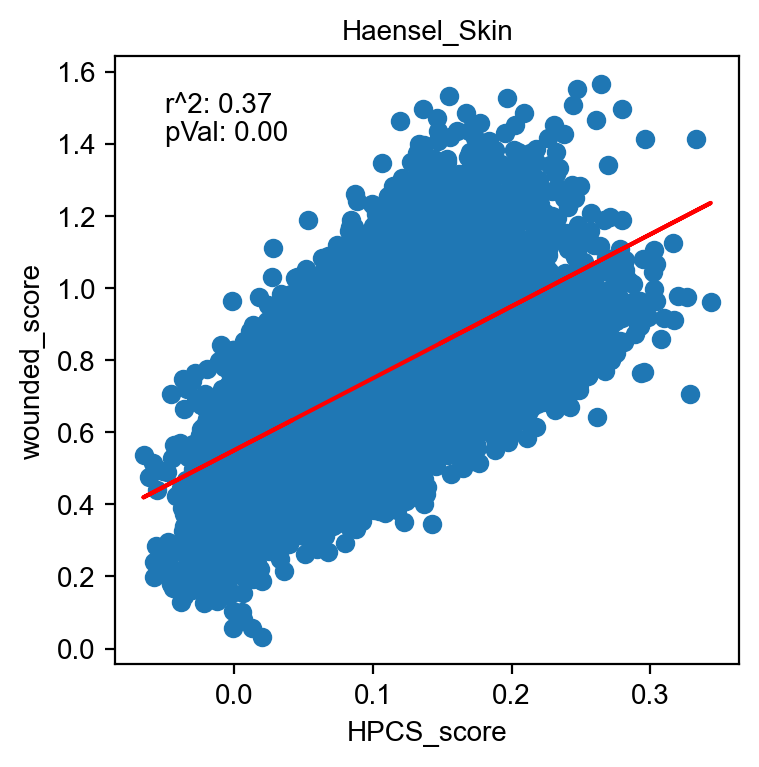

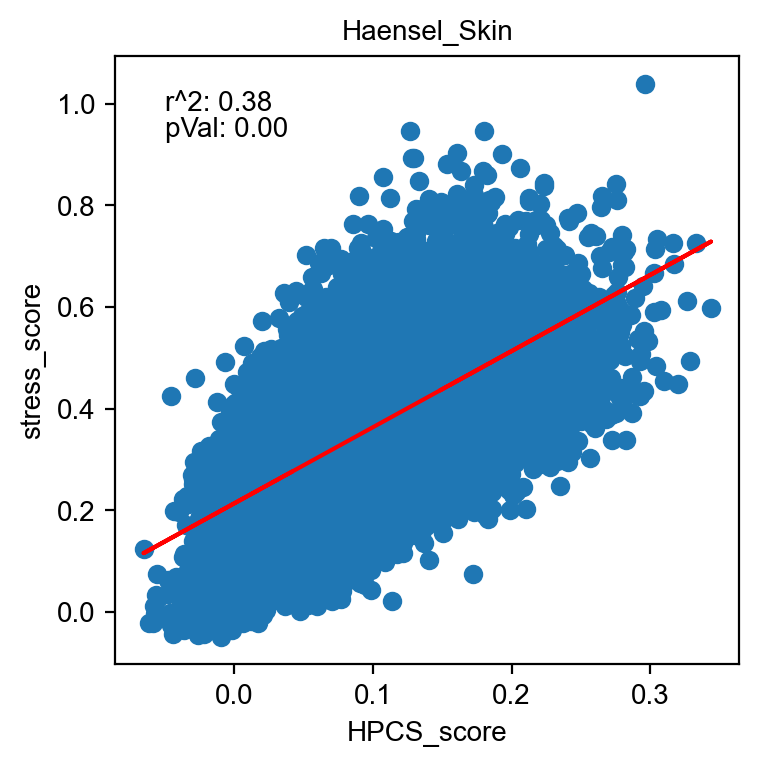

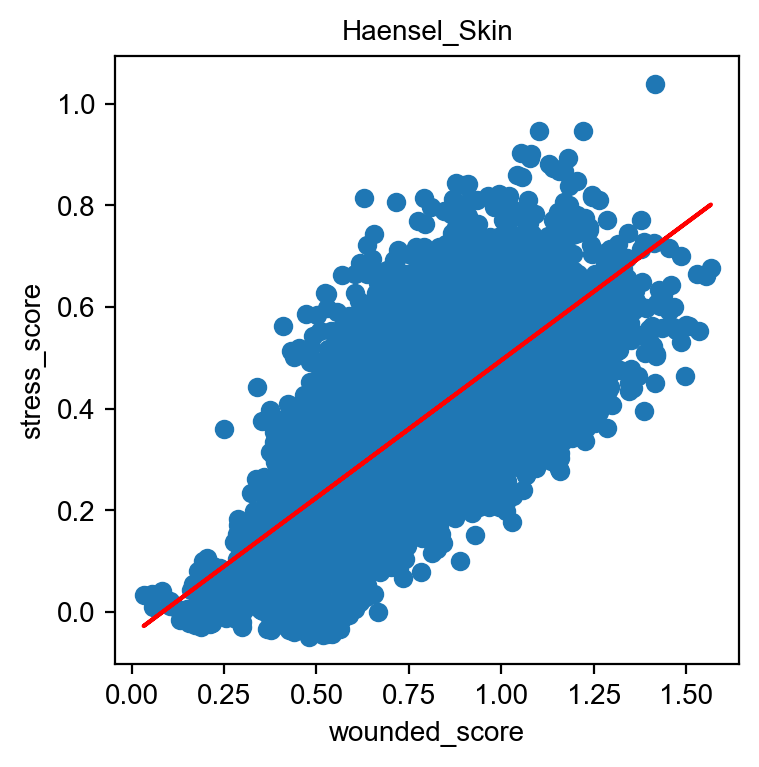

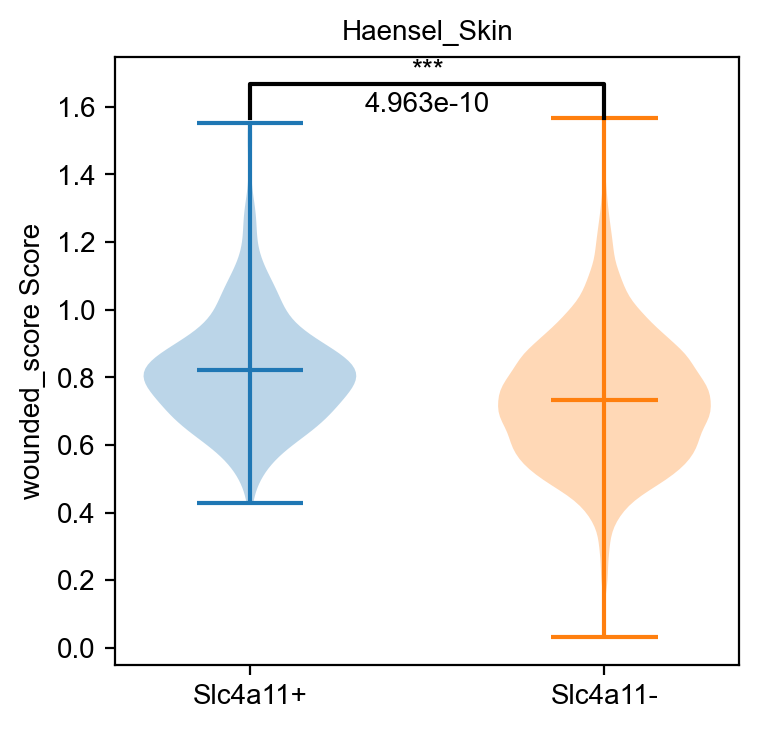

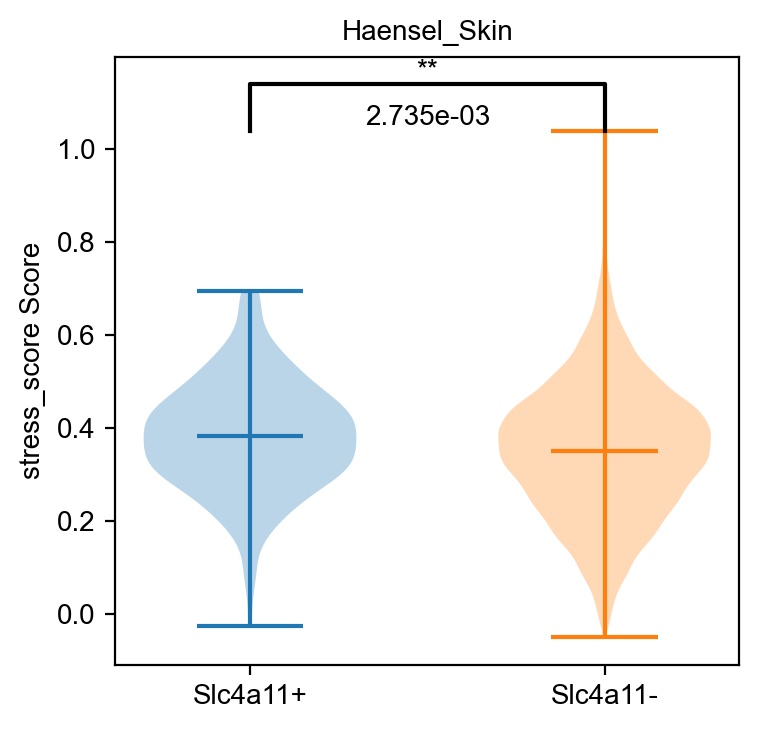

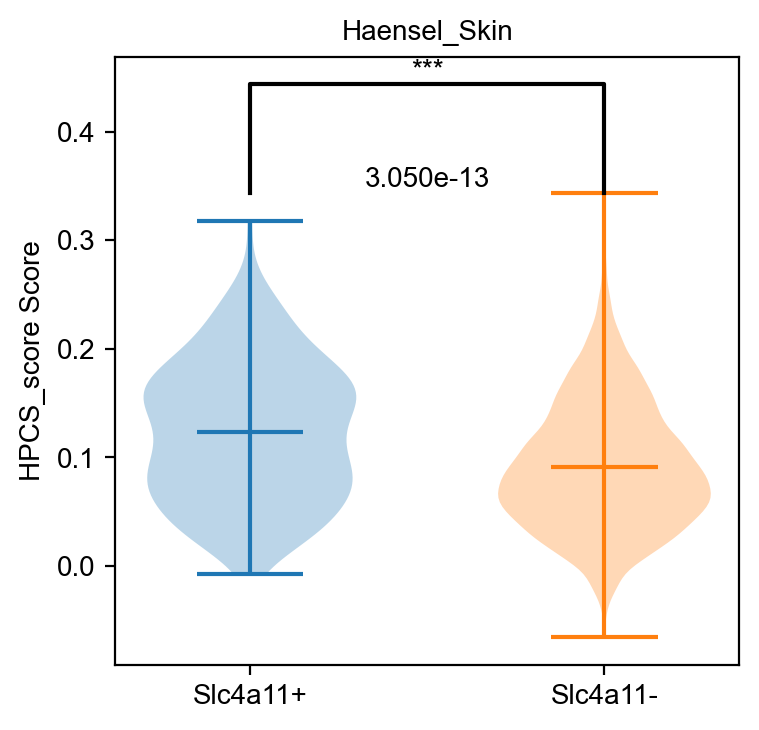

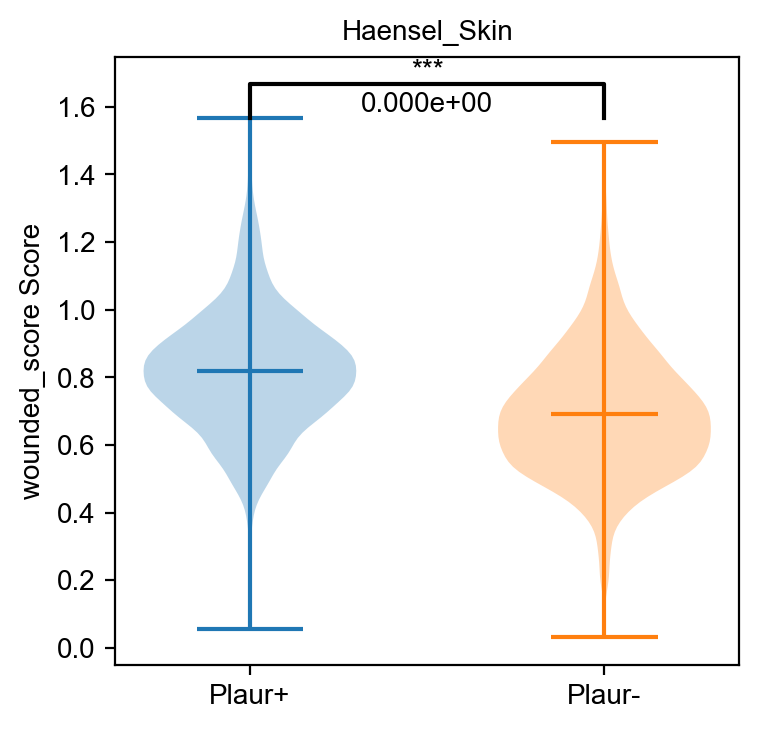

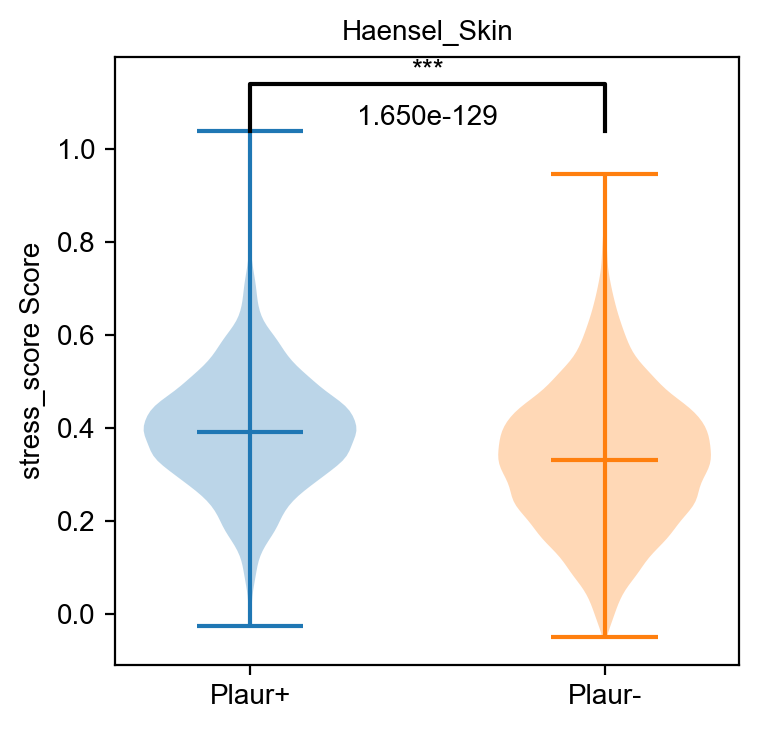

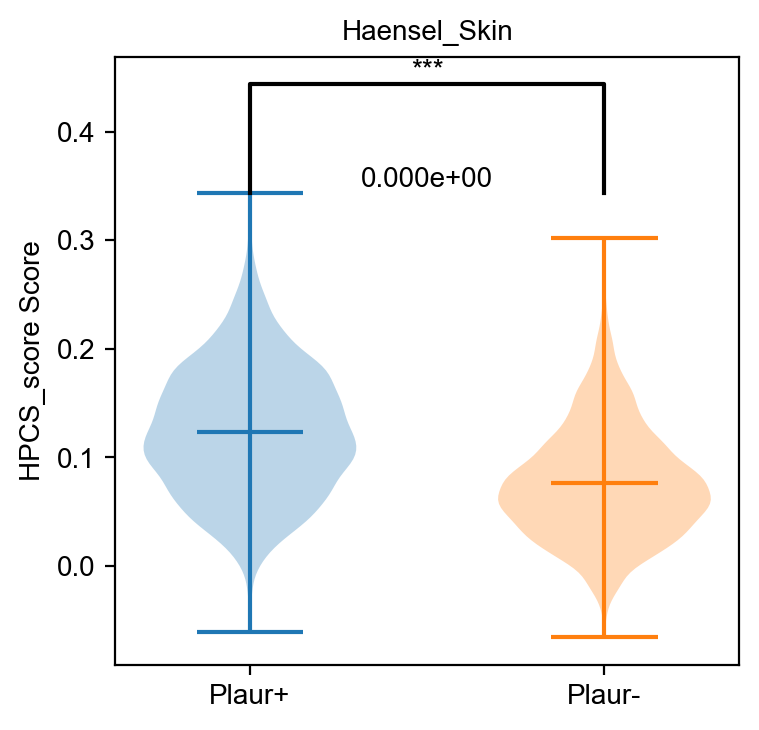

In [71]:
import corrVizHelpers as scH
saveDir = "figures/revisions4"
key="Haensel_Skin"
scH.plotScatter(adata.obs, "HPCS_score", "wounded_score", key, save=saveDir)
scH.plotScatter(adata.obs, "HPCS_score", "stress_score", key, save=saveDir)
scH.plotScatter(adata.obs, "wounded_score", "stress_score", key, save=saveDir)
rdata = adata.raw.to_adata()
slc="Slc4a11"
if(isinstance(rdata.X, np.ndarray)):
    slcScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names=="Plaur"].X).flatten() > 0
else:
    slcScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names=="Plaur"].X.todense()).flatten() > 0

plotBoxPlot(adata.obs, "wounded_score", slcScore, slc, key, save=saveDir)
plotBoxPlot(adata.obs, "stress_score", slcScore, slc, key, save=saveDir)
plotBoxPlot(adata.obs, "HPCS_score", slcScore, slc, key, save=saveDir)

plotBoxPlot(adata.obs, "wounded_score", parScore,"Plaur", key, save=saveDir)
plotBoxPlot(adata.obs, "stress_score", parScore, "Plaur", key, save=saveDir)
plotBoxPlot(adata.obs, "HPCS_score", parScore, "Plaur", key, save=saveDir)

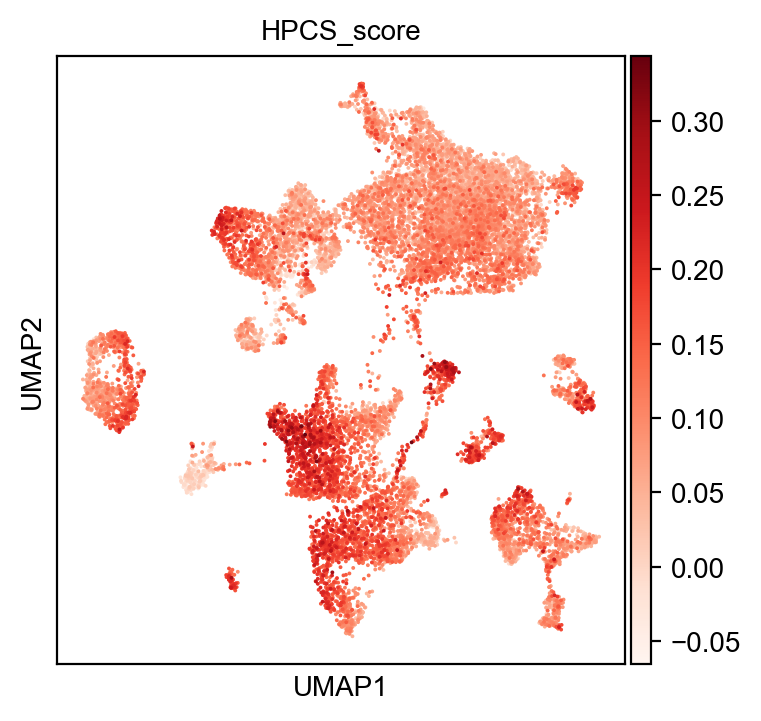

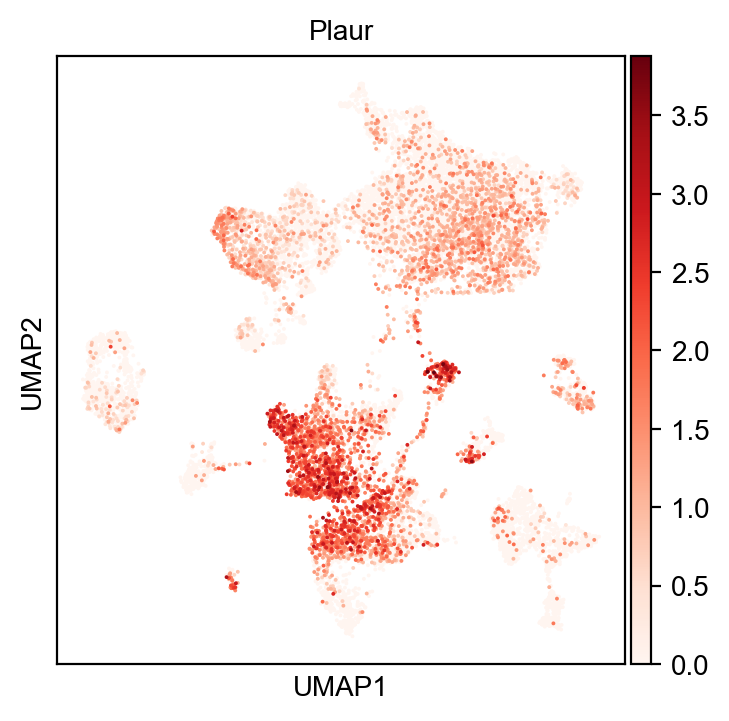

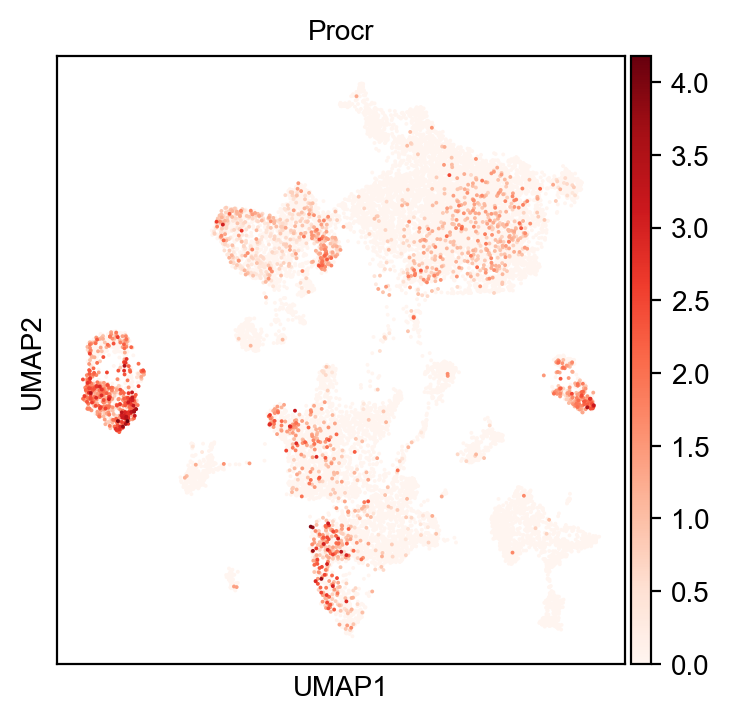

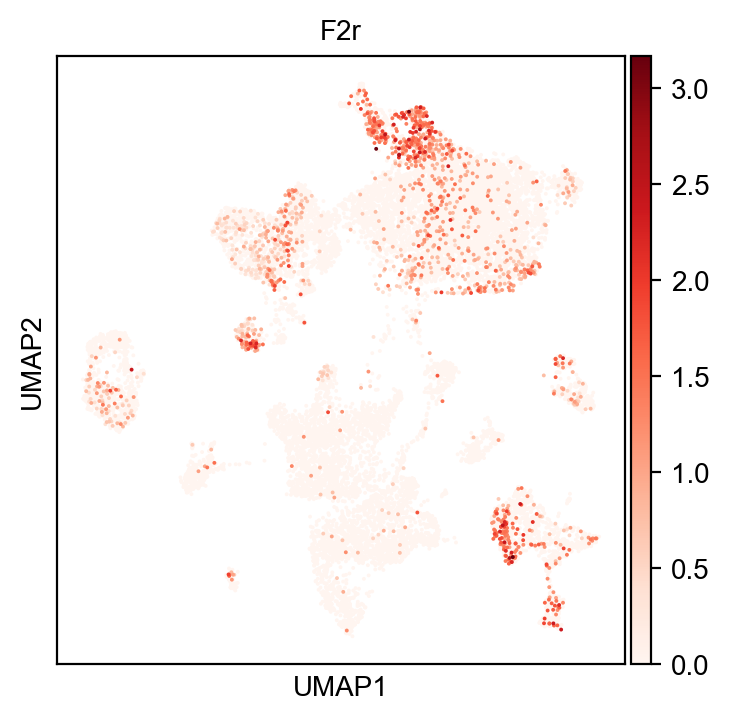

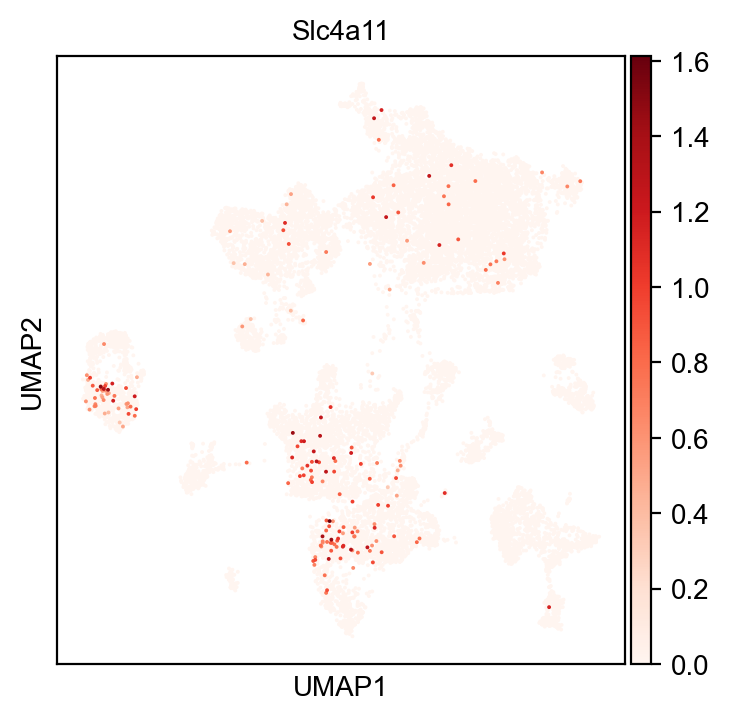

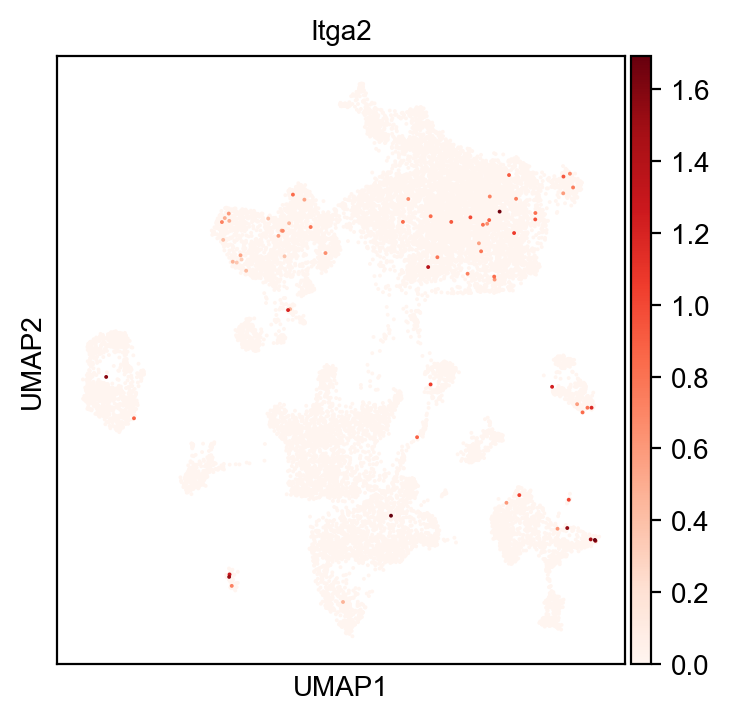

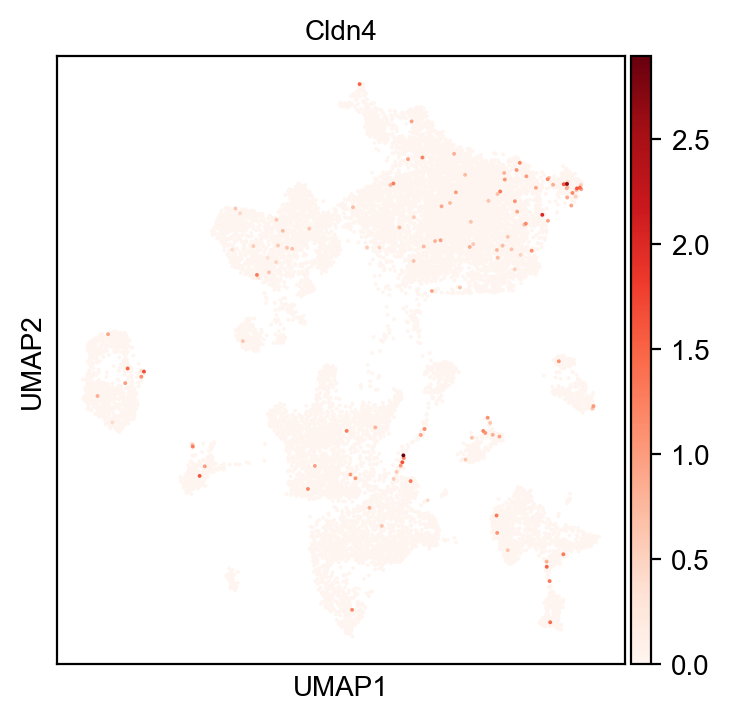

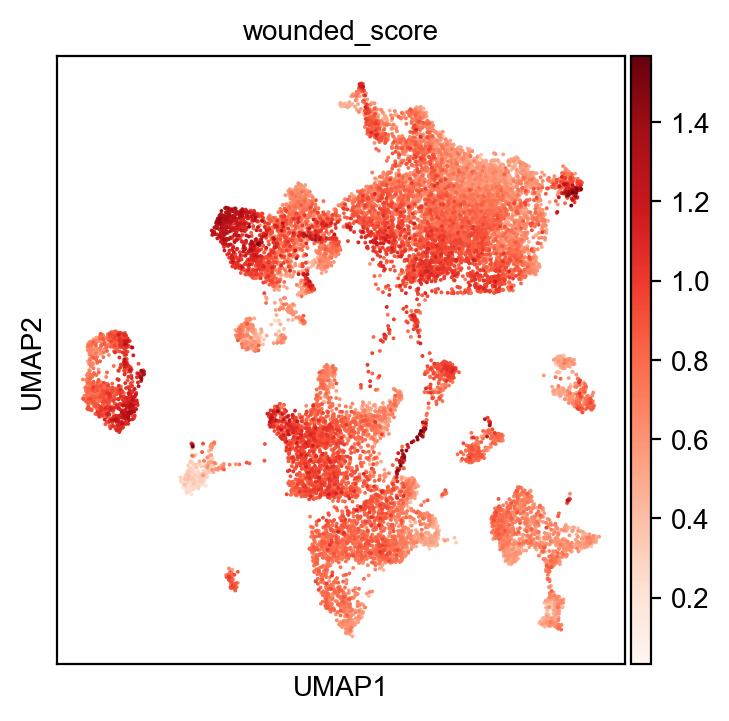

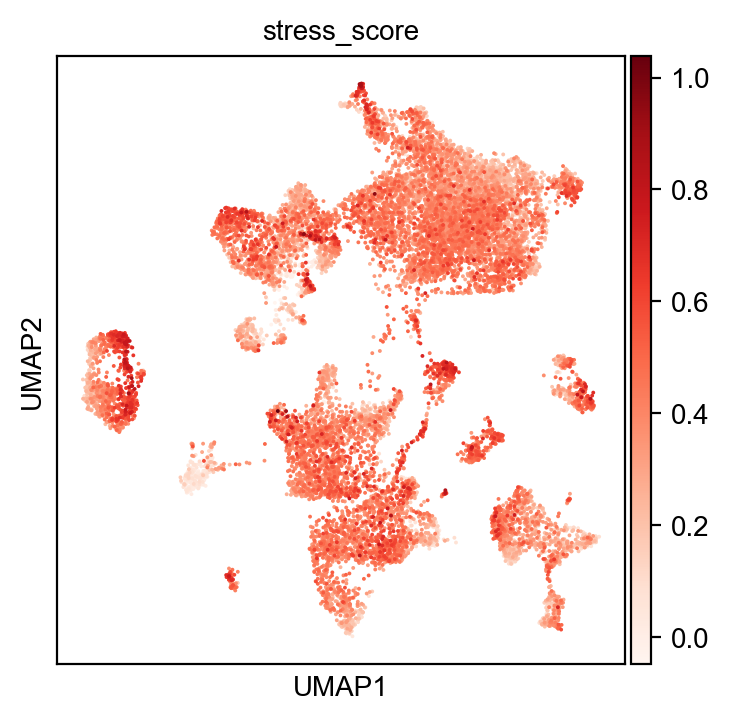

In [72]:
sc.settings.figdir = saveDir
for col in ["HPCS_score","Plaur", "Procr", "F2r", 
                         "Slc4a11", "Itga2", "Cldn4","wounded_score", "stress_score"]:
    sc.pl.umap(adata, color=col,ncols=1, cmap="Reds", save=f"{col}_Haensel_skin.svg")

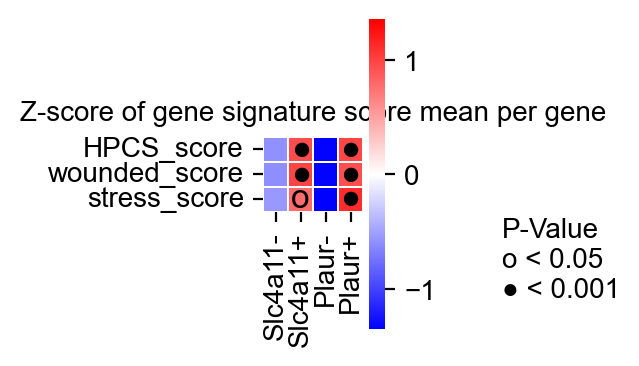

In [75]:
from sklearn import preprocessing

gSigs = ["HPCS_score","wounded_score","stress_score"]
genes = ["Slc4a11","Plaur"]
avgScores = np.zeros((len(gSigs),len(genes)*2))
pvalScores = np.zeros((len(gSigs),len(genes)))

for gi, gene in enumerate(genes):

    if(isinstance(rdata.X, np.ndarray)):
        geneExp = np.array(rdata[:,rdata.var_names==gene].X).flatten() > 0
    else:
        geneExp = np.array(rdata[:,rdata.var_names==gene].X.todense()).flatten() > 0

    for gsi,gs in enumerate(gSigs):
            
        geneExpPos = adata.obs[gs][geneExp]
        geneExpNeg = adata.obs[gs][np.logical_not(geneExp)]
        
        avgScores[gsi,gi*2] = np.mean(geneExpPos)
        avgScores[gsi,gi*2+1] = np.mean(geneExpNeg)
        
        t_stat, p_val = stats.ttest_ind(geneExpPos, geneExpNeg)
        pvalScores[gsi,gi] = p_val


scaler = preprocessing.StandardScaler().fit_transform(avgScores.T)
avgScoresDF = pd.DataFrame(scaler[[1,0,3,2]].T, index=gSigs, columns=['Slc4a11-', 'Slc4a11+', 'Plaur-','Plaur+']) #

fig, ax = plt.subplots(figsize=(2.2,2.2)) 
plt.grid(False)
sns.heatmap(avgScoresDF, cmap="bwr", xticklabels=True, ax=ax, square=True, linewidths=0.1, cbar=True, vmax=-1*np.min(scaler))

for (i, j), significant in np.ndenumerate(pvalScores):
    #print(i,j)
    if significant < 0.001:
        plt.text(j*2 + 1.5, i + 0.5, "●", color='black', ha='center', va='center', fontsize=12)
    elif significant < 0.05:
        plt.text(j*2 + 1.5, i + 0.5, 'o', color='black', ha='center', va='center', fontsize=12)
    
ax.set_title(f"Z-score of gene signature score mean per gene")
ax.tick_params(axis='y', labelrotation=0)
fig.text(1.1, 0.3, f"P-Value\no < 0.05\n● < 0.001")
fig.tight_layout()
plt.show()
fig.savefig(f"{saveDir}/zscore_HaenselSkin_revSC_GsSlc4a11PalurPval.svg")

In [76]:
resultsFile

'write/Haensel_mouseSkinRegen_regen.h5ad'

In [77]:
adata.write(resultsFile)
adata

AnnData object with n_obs × n_vars = 15497 × 1884
    obs: 'label', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'wound', 'stress_score', 'wounded_score', 'HPCS_score'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'label_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'wound_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [92]:
import scanpy as sc
#writeDir = "write/"
#fileName = "GSE207938_ProgressionCohort_Norm"
#resultsFile = writeDir + fileName + '.h5ad' 
#adata = sc.read_h5ad(resultsFile)
#sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, fontsize=10, format='png')
#sc.pl.umap(adata, color=["leiden","HPCS_score","condition","PLAUR", "PROCR", "F2R", "SLC4A11", "ITGA2", "CLDN4"],ncols=3, cmap="Reds")


ValueError: Inputs must not be empty.

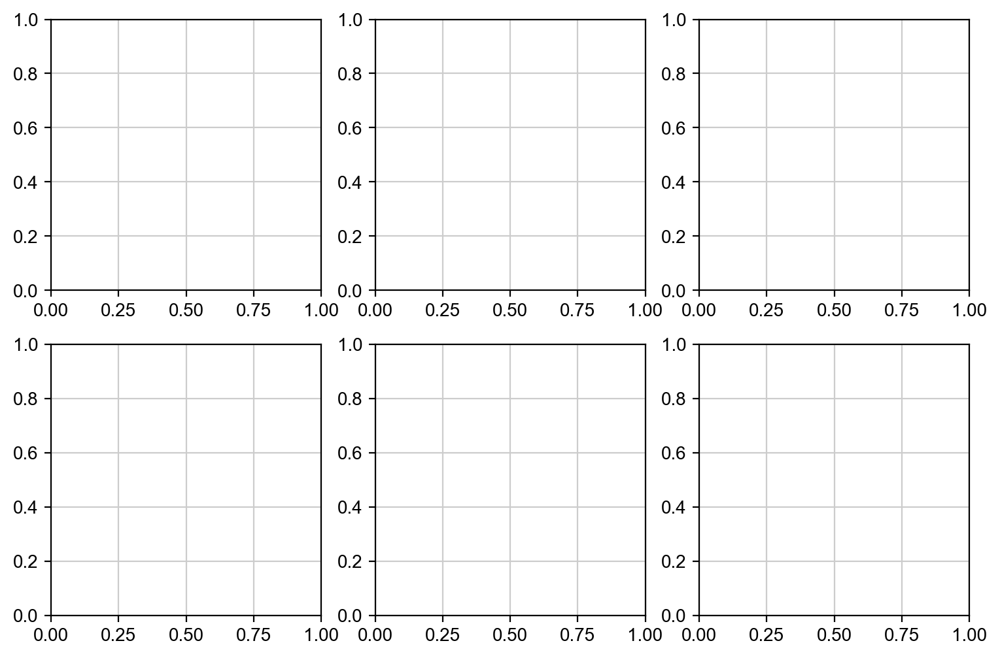

In [93]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import linregress

adatar = adata.raw.to_adata()

def plotExpvScore(gene, ax):
    geneExpr = np.array(adatar[:,adatar.var_names==gene].X.todense().flatten())[0]
    
    x = adata.obs.HPCS_score.values[geneExpr>0]
    y = geneExpr[geneExpr>0]
    
    # Fit linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    #print(slope, intercept, r_value, p_value, std_err)
    
    # Calculate confidence interval
    confidence_interval = 1.96 * std_err  # 95% confidence interval
    
    # Create scatter plot
    ax.scatter(x, y, label="Data points", s=1)
    
    # Plot regression line
    ax.plot(x, slope * x + intercept, color='red', label="Regression line")
    
    ## Plot confidence interval
    #ax.fill_between(x, slope * x + intercept - confidence_interval, slope * x + intercept + confidence_interval, color='blue', alpha=0.3, label="Confidence interval")
    
    # Add labels and title
    ax.set_title(f"{gene}; R: {r_value:.2f} p: {p_value:.3f}")
    ax.set_xlabel("HPCS Score")
    ax.set_ylabel(f"log+1 {gene} >0")

    return(r_value)

genes = ["PLAUR", "PROCR", "F2R", "SLC4A11", "ITGA2", "CLDN4"]
rvals = np.zeros(len(genes))
fig, axs = plt.subplots(2,3, figsize=(9,6))

for i,ax in enumerate(axs.flatten()):
    rvals[i] = plotExpvScore(genes[i], ax)

fig.tight_layout()

pd.DataFrame(rvals, index=genes, columns=[fileName]).to_csv(f"{writeDir}/hpcsCorr/{fileName}_GeneRs.csv")